
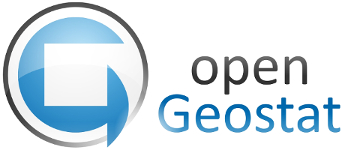

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import pygslib
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline

# Despliegue de Datos

In [2]:
carpeta_origen = "C:/Users/UserPro/Copper_Project/"
archivo1 = "Cu_Sample_Composite.csv" ## Corresponde a datos ya compositados, lo ideal es no compositarlos antes del análisis de Outlier
archivo2 = "Block_Model.csv"  ## Modelo de Bloques creado en el software libre RECMIN donde también se hizo el modelamiento
datadh= pd.read_csv(carpeta_origen + archivo1, sep=";")
datablock = pd.read_csv(carpeta_origen + archivo2, sep=";")

In [3]:
dataset = datadh.copy() ## Realizamos una copia para hacer modificaciones
dataset1 = pd.DataFrame(dataset.dropna())
datadh.head()

,mid_x,mid_y,mid_z,Lit,Cu
0,3030.9,1783.98,481.55,Z1,0.1
1,3030.9,1783.98,476.55,Z1,0.1
2,3030.9,1783.98,471.55,Z1,0.1
3,3030.9,1783.98,466.55,Z1,0.1
4,3030.9,1783.98,461.55,Z1,0.1


In [4]:
datablock.head()

,X,Y,Z,dX,dY,dZ,ID,Lit
0,3055,1835,423.75,10,10,7.5,448039,Z1
1,3065,1835,423.75,10,10,7.5,448040,Z1
2,3045,1845,423.75,10,10,7.5,448122,Z1
3,3055,1845,423.75,10,10,7.5,448123,Z1
4,3065,1845,423.75,10,10,7.5,448124,Z1


In [5]:
continuous1 = 'Cu'
fig = px.scatter_3d(datadh, x='mid_x', y='mid_y', z='mid_z', color=continuous1, color_continuous_scale=px.colors.sequential.Jet)
fig.update_traces(marker=dict(size=3))
fig.show()
categorical = 'Lit'
datadh[categorical]=datadh[categorical].astype(str)
fig = px.scatter_3d(datadh, x='mid_x', y='mid_y', z='mid_z', color=categorical)
fig.update_traces(marker=dict(size=4))
fig.show()  ## Vista de los DDH con ley de Cu (%) y logueo geológico

In [ ]:
categorical1 = 'Lit'
fig = px.scatter_3d(datablock, x='X', y='Y', z='Z', color=categorical1)
fig.update_traces(marker=dict(size=2))
fig.show()
## Vista del modelo de bloques categorizado por los dominios de estimación

# Análisis Estadístico por Dominios

In [7]:
variables = ["Lit" , "Cu"]
dataset2=pd.DataFrame(dataset1[variables])  ## Separamos las variables a analizar

In [8]:
datagroup = dataset2.groupby('Lit')
datagroup.describe()  ## Agrupamos por dominio

Cu                                                      
      count      mean       std   min     25%   50%    75%    max
Lit                                                              
Z1   1089.0  1.377961  1.121780  0.10  0.5300  1.07  1.890   6.98
Z2   1560.0  2.233788  1.905945  0.01  0.7175  1.67  3.355   9.58
Z3   3391.0  1.108888  1.195269  0.01  0.3100  0.74  1.480  13.74

In [9]:
datagroup.var()

,Cu
Lit,
Z1,1.258391
Z2,3.632626
Z3,1.428669


In [10]:
datagroup.std()/datagroup.mean() #Coeficiente de variación por dominio

,Cu
Lit,
Z1,0.814087
Z2,0.853234
Z3,1.077899


In [11]:
dataZ1 = datagroup.get_group("Z1")
dataZ2 = datagroup.get_group("Z2")
dataZ3 = datagroup.get_group("Z3") ## Agrupamiento por dominio en diferentes Dataframe

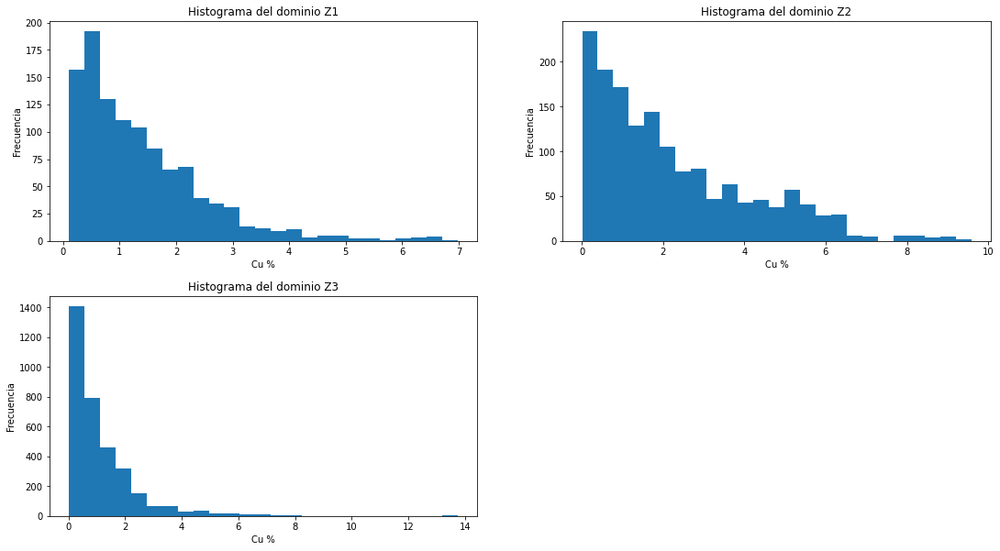

In [12]:
plt.subplot(221)
plt.hist(dataZ1["Cu"], bins=25)
plt.title("Histograma del dominio Z1")
plt.xlabel("Cu %")
plt.ylabel("Frecuencia")
plt.subplot(222)
plt.hist(dataZ2["Cu"], bins=25)
plt.title("Histograma del dominio Z2")
plt.xlabel("Cu %")
plt.ylabel("Frecuencia")
plt.subplot(223)
plt.hist(dataZ3["Cu"], bins=25)
plt.title("Histograma del dominio Z3")
plt.xlabel("Cu %")
plt.ylabel("Frecuencia")

plt.subplots_adjust(right=2.5, top=2, hspace=0.25)  ## Histogramas por dominio
plt.show()

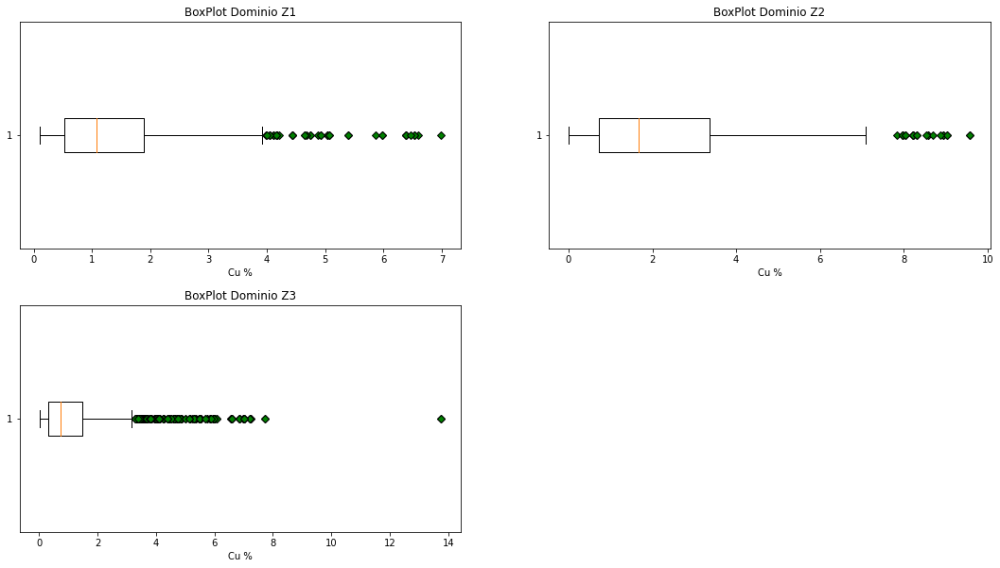

In [13]:
diamantes = dict(markerfacecolor='g', marker='D')

plt.subplot(221)
plt.boxplot(dataZ1["Cu"], vert=False, flierprops=diamantes, showfliers=True)
plt.xlabel("Cu %")
plt.title("BoxPlot Dominio Z1")
plt.subplot(222)
plt.boxplot(dataZ2["Cu"], vert=False, flierprops=diamantes, showfliers=True)
plt.xlabel("Cu %")
plt.title("BoxPlot Dominio Z2")
plt.subplot(223)
plt.boxplot(dataZ3["Cu"], vert=False, flierprops=diamantes, showfliers=True)
plt.xlabel("Cu %")
plt.title("BoxPlot Dominio Z3")

plt.subplots_adjust(right=2.5, top=2, hspace=0.25)  ## BoxPlot por dominio resaltando los outlier
plt.show()

In [14]:
import statsmodels.api as sm
import pylab

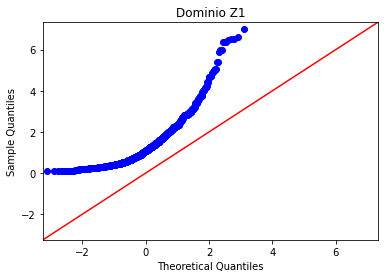

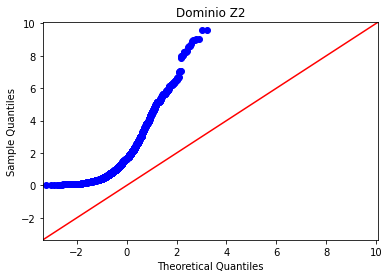

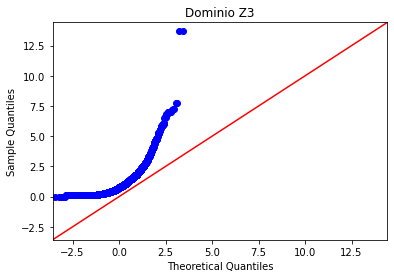

In [15]:
sm.qqplot(dataZ1["Cu"], line="45")
pylab.title("Dominio Z1")
sm.qqplot(dataZ2["Cu"], line="45")
pylab.title("Dominio Z2")
sm.qqplot(dataZ3["Cu"], line="45")
pylab.title("Dominio Z3")
pylab.show()    ## Gráficos PPplot para observar la normalidad de los datos por dominio, también se pueden observar los outlier

# Análisis de Outlier en el Dominio Z2

In [16]:
outlierZ2_BP=dataZ2.quantile(0.75)+1.5*(dataZ2.quantile(0.75)-dataZ2.quantile(0.25))
outlierZ2_BP  ## Outlier por rango intercuartil

Cu    7.31125
dtype: float64

In [17]:
outlierZ2_DS= dataZ2.mean() + 3*dataZ2.std()
outlierZ2_DS  ## Outlier por desviación estándar

Cu    7.951623
dtype: float64

In [18]:
(dataZ2[dataZ2['Cu']>=7.31]).count()  ## Cantidad de Outlier, representan el 1.5% de los datos

Lit    23
Cu     23
dtype: int64

In [19]:
datagroup_dh = dataset1.groupby('Lit')  ## Reintegramos al Dataframe las coordenadas para la estimación
dataZ2_dh = datagroup_dh.get_group("Z2")
dataZ2_dh.describe()

,mid_x,mid_y,mid_z,Cu
count,1560.000000,1560.000000,1560.000000,1560.000000
mean,2843.753295,2039.450372,434.551506,2.233788
std,171.986952,181.897434,36.780958,1.905945
min,2437.060000,1655.710000,300.710000,0.010000
25%,2742.530000,1904.420000,411.455000,0.717500
50%,2859.690000,2037.640000,435.820000,1.670000
75%,2965.730000,2163.680000,459.455000,3.355000
max,3191.310000,2422.130000,555.730000,9.580000


In [20]:
dataZ2_dh['Cu_out'] = np.where(dataZ2_dh['Cu']>=7.31,7.31,dataZ2_dh['Cu'])
dataZ2_dh.head()   ## Reemplazamos los outlier aplicando CAPPING

<ipython-input-20-8fbbe4a24f6a>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,mid_x,mid_y,mid_z,Lit,Cu,Cu_out
7,3030.9,1783.98,448.55,Z2,0.01,0.01
8,3030.9,1783.98,443.55,Z2,0.01,0.01
9,3030.9,1783.98,438.55,Z2,0.01,0.01
10,3030.9,1783.98,433.55,Z2,0.01,0.01
11,3030.9,1783.98,428.55,Z2,0.01,0.01


In [21]:
(dataZ2_dh[dataZ2_dh['Cu_out']>7.31]).count()  ##Verificamos la cantidad de Outlier

mid_x     0
mid_y     0
mid_z     0
Lit       0
Cu        0
Cu_out    0
dtype: int64

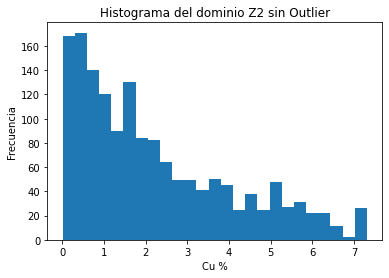

In [22]:
plt.hist(dataZ2_dh["Cu_out"], bins=25)  ## Histograma de los datos sin Outlier
plt.title("Histograma del dominio Z2 sin Outlier")
plt.xlabel("Cu %")
plt.ylabel("Frecuencia")

plt.show()

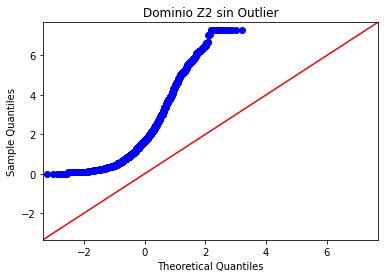

In [23]:
sm.qqplot(dataZ2_dh["Cu_out"], line="45")
pylab.title("Dominio Z2 sin Outlier")
pylab.show()

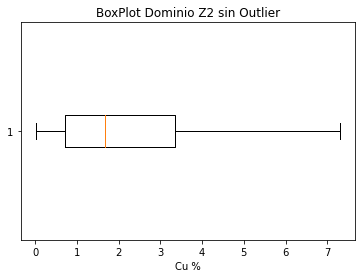

In [24]:
plt.boxplot(dataZ2_dh["Cu_out"], vert=False, flierprops=diamantes, showfliers=True)
plt.xlabel("Cu %")
plt.title("BoxPlot Dominio Z2 sin Outlier")

plt.show()  ## BoxPlot del dominio Z2 sin Outlier

In [25]:
dataZ2_dh.to_csv(carpeta_origen + "dataZ2_dh.csv")  #Guardamos los datos para desplegarlo en el software libre SGEMS para estimación

# Declasterización por Celdas Dominio Z2

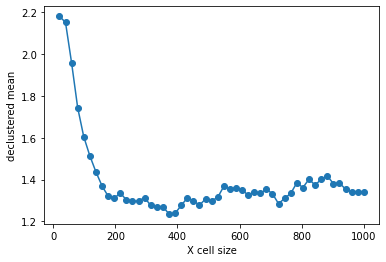

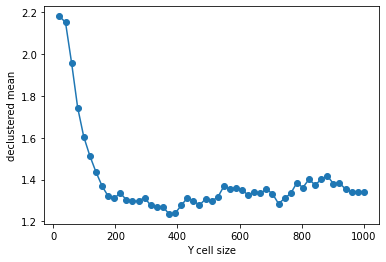

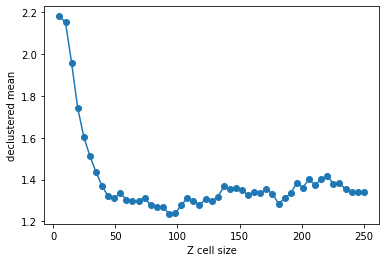

In [26]:
#Parámetros de declasterización 
parameters_declus = { 
        'x'      :  dataZ2_dh['mid_x'], 
        'y'      :  dataZ2_dh['mid_y'],  
        'z'      :  dataZ2_dh['mid_z'], 
        'vr'     :  dataZ2_dh['Cu_out'],   
        'anisy'  :  1.,       
        'anisz'  :  0.25,              
        'minmax' :  0,                 
        'ncell'  :  50,                  
        'cmin'   :  20., 
        'cmax'   :  1000.,                 
        'noff'   :  8,                    
        'maxcel' :  -1}               

# Declasterización 
wtopt,vrop,wtmin,wtmax,error, \
xinc,yinc,zinc,rxcs,rycs,rzcs,rvrcr = pygslib.gslib.declus(parameters_declus)

# Ploteo de los datos declasterizados media vs tamaño de cela
plt.plot (rxcs, rvrcr, '-o')
plt.xlabel('X cell size')
plt.ylabel('declustered mean')
plt.show()
plt.plot (rycs, rvrcr, '-o')
plt.xlabel('Y cell size')
plt.ylabel('declustered mean')
plt.show()
plt.plot (rzcs, rvrcr, '-o')
plt.xlabel('Z cell size')
plt.ylabel('declustered mean')
plt.show()

In [27]:
# Cálculo de los ponderadores o pesos según la celda óptima de declasterización
parameters_declus = { 
        'x'      :  dataZ2_dh['mid_x'], 
        'y'      :  dataZ2_dh['mid_y'],  
        'z'      :  dataZ2_dh['mid_z'], 
        'vr'     :  dataZ2_dh['Cu_out'],  
        'anisy'  :  1.,    # y == x
        'anisz'  :  0.25,  # z = x/20     
        'minmax' :  0,                 
        'ncell'  :  1,                  
        'cmin'   :  200., 
        'cmax'   :  200.,                 
        'noff'   :  8,                    
        'maxcel' :  -1}  
 
# declustering 
wtopt,vrop,wtmin,wtmax,error, \
xinc,yinc,zinc,rxcs,rycs,rzcs,rvrcr = pygslib.gslib.declus(parameters_declus)

In [28]:
dataZ2_dh['weight'] = wtopt  ## Integramos los pesos de declasterización al Dataframe

<ipython-input-28-ae74ece2aab2>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [29]:
dataZ2_dh['Cu_dec'] = dataZ2_dh['Cu_out']*dataZ2_dh['weight'] ## Calculámos los datos de declasterización al Dataframe 
dataZ2_dh.head()

<ipython-input-29-dcdb9dd03792>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,mid_x,mid_y,mid_z,Lit,Cu,Cu_out,weight,Cu_dec
7,3030.9,1783.98,448.55,Z2,0.01,0.01,0.652318,0.006523
8,3030.9,1783.98,443.55,Z2,0.01,0.01,0.464818,0.004648
9,3030.9,1783.98,438.55,Z2,0.01,0.01,0.464818,0.004648
10,3030.9,1783.98,433.55,Z2,0.01,0.01,0.368299,0.003683
11,3030.9,1783.98,428.55,Z2,0.01,0.01,0.332769,0.003328


In [30]:
dataZ2_dh.describe()  ##Resumen de los datos, la media declasterizada es menor a la normal

,mid_x,mid_y,mid_z,Cu,Cu_out,weight,Cu_dec
count,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000,1560.000000
mean,2843.753295,2039.450372,434.551506,2.233788,2.216135,1.000000,1.321439
std,171.986952,181.897434,36.780958,1.905945,1.851537,1.095303,1.268797
min,2437.060000,1655.710000,300.710000,0.010000,0.010000,0.183989,0.003243
25%,2742.530000,1904.420000,411.455000,0.717500,0.717500,0.347073,0.591309
50%,2859.690000,2037.640000,435.820000,1.670000,1.670000,0.614563,1.028130
75%,2965.730000,2163.680000,459.455000,3.355000,3.355000,1.149860,1.593336
max,3191.310000,2422.130000,555.730000,9.580000,7.310000,8.888076,16.422997


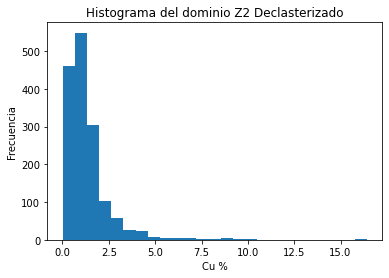

In [31]:
plt.hist(dataZ2_dh["Cu_dec"], bins=25)
plt.title("Histograma del dominio Z2 Declasterizado")
plt.xlabel("Cu %")
plt.ylabel("Frecuencia")

plt.show()  ## Histograma de datos declasterizados

# Categorización de Recursos

In [32]:
archivo3 = "Z2_Block_Estimate.csv"  ## Se hizo la estimación por Kriging Ordinario (OK) y simulación condicional (SGSIM)
blkestimate= pd.read_csv(carpeta_origen + archivo3, sep=";") 

In [33]:
blkestimate['CV_OK'] = (blkestimate['Cu_OK_krig_var']**0.5)/blkestimate['Cu_OK']

blkestimate['Category'] =np.where(blkestimate['CV_OK']<=0.25,'Medido',
                                  np.where(blkestimate['CV_OK']<=0.50,"Indicado",
                                            np.where(blkestimate['CV_OK']<=2.5,"Inferido","No_Cat")))


blkestimate.head(10)  ## Se realiza el cálculo del coeficiente de variación y se categoriza por este parámetro

,XC,YC,ZC,Cu_OK,Cu_OK_krig_var,ID,Lit,Cu_SGSIM,dX,dY,dZ,CV_OK,Category
0,2955,2445,296.25,NaN,NaN,334629,Z2,2.170180,10,10,7.5,NaN,No_Cat
1,2965,2445,296.25,NaN,NaN,334630,Z2,2.190690,10,10,7.5,NaN,No_Cat
2,2975,2445,296.25,NaN,NaN,334631,Z2,0.930992,10,10,7.5,NaN,No_Cat
3,2955,2415,303.75,0.122344,0.736788,341349,Z2,0.204327,10,10,7.5,7.015984,No_Cat
4,2965,2415,303.75,0.119218,0.632695,341350,Z2,1.034150,10,10,7.5,6.671990,No_Cat
5,2945,2425,303.75,0.130928,1.043050,341432,Z2,0.526284,10,10,7.5,7.800457,No_Cat
6,2955,2425,303.75,0.115276,0.497967,341433,Z2,0.400687,10,10,7.5,6.121550,No_Cat
7,2965,2425,303.75,0.117118,0.558464,341434,Z2,2.197970,10,10,7.5,6.380783,No_Cat
8,2975,2425,303.75,0.133817,1.143170,341435,Z2,1.808060,10,10,7.5,7.989951,No_Cat
9,2935,2435,303.75,0.150516,1.709890,341515,Z2,1.047030,10,10,7.5,8.687632,No_Cat


In [34]:
blkestimate['Category_Cod'] =np.where(blkestimate['CV_OK']<=0.25,1,
                                  np.where(blkestimate['CV_OK']<=0.50,2,
                                            np.where(blkestimate['CV_OK']<=2.5,3,4)))


blkestimate.head(10)  ## Se realiza el cálculo del coeficiente de variación y se categoriza por este parámetro

,XC,YC,ZC,Cu_OK,Cu_OK_krig_var,ID,Lit,Cu_SGSIM,dX,dY,dZ,CV_OK,Category,Category_Cod
0,2955,2445,296.25,NaN,NaN,334629,Z2,2.170180,10,10,7.5,NaN,No_Cat,4
1,2965,2445,296.25,NaN,NaN,334630,Z2,2.190690,10,10,7.5,NaN,No_Cat,4
2,2975,2445,296.25,NaN,NaN,334631,Z2,0.930992,10,10,7.5,NaN,No_Cat,4
3,2955,2415,303.75,0.122344,0.736788,341349,Z2,0.204327,10,10,7.5,7.015984,No_Cat,4
4,2965,2415,303.75,0.119218,0.632695,341350,Z2,1.034150,10,10,7.5,6.671990,No_Cat,4
5,2945,2425,303.75,0.130928,1.043050,341432,Z2,0.526284,10,10,7.5,7.800457,No_Cat,4
6,2955,2425,303.75,0.115276,0.497967,341433,Z2,0.400687,10,10,7.5,6.121550,No_Cat,4
7,2965,2425,303.75,0.117118,0.558464,341434,Z2,2.197970,10,10,7.5,6.380783,No_Cat,4
8,2975,2425,303.75,0.133817,1.143170,341435,Z2,1.808060,10,10,7.5,7.989951,No_Cat,4
9,2935,2435,303.75,0.150516,1.709890,341515,Z2,1.047030,10,10,7.5,8.687632,No_Cat,4


In [35]:
blkestimate2=pd.DataFrame(blkestimate.dropna())  ## Se eliminan las celdas vacías
blkestimate.describe()

,XC,YC,ZC,Cu_OK,Cu_OK_krig_var,ID,Cu_SGSIM,dX,dY,dZ,CV_OK,Category_Cod
count,49292.000000,49292.000000,49292.000000,49204.000000,49204.000000,49292.000000,49291.000000,49292.0,49292.0,49292.0,49204.000000,49292.000000
mean,2762.007831,2111.744502,440.757527,1.421160,1.899970,466144.551307,2.209298,10.0,10.0,7.5,2.701801,3.045403
std,233.006952,213.993357,39.083797,1.377004,0.999830,36866.120783,1.848503,0.0,0.0,0.0,3.245688,0.924252
min,2385.000000,1625.000000,296.250000,0.011009,0.366759,334629.000000,0.010000,10.0,10.0,7.5,0.091739,1.000000
25%,2545.000000,1955.000000,416.250000,0.414029,1.058123,443013.750000,0.710665,10.0,10.0,7.5,0.537650,3.000000
50%,2775.000000,2115.000000,438.750000,0.870774,1.666015,465584.500000,1.662500,10.0,10.0,7.5,1.571069,3.000000
75%,2955.000000,2295.000000,468.750000,1.966273,2.662720,490267.250000,3.357340,10.0,10.0,7.5,3.652615,4.000000
max,3215.000000,2445.000000,558.750000,7.143690,5.227720,578608.000000,7.310000,10.0,10.0,7.5,130.197717,4.000000


In [ ]:
continuous4 = 'Cu_out'  
fig = px.scatter_3d(dataZ2_dh, x='mid_x', y='mid_y', z='mid_z', color=continuous4, color_continuous_scale=px.colors.sequential.Jet)
fig.update_traces(marker=dict(size=2.5))
fig.show()

In [36]:
continuous2 = 'Cu_OK'
fig = px.scatter_3d(blkestimate, x='XC', y='YC', z='ZC', color=continuous2, color_continuous_scale=px.colors.sequential.Jet)
fig.update_traces(marker=dict(size=2.5))
continuous3 = 'Cu_SGSIM'
fig.show()
fig = px.scatter_3d(blkestimate, x='XC', y='YC', z='ZC', color=continuous3, color_continuous_scale=px.colors.sequential.Jet)
fig.update_traces(marker=dict(size=2.5))
fig.show()  ## Visualización de las muestras, estimación OK y estimación SGSIM del dominio Z2

In [37]:
category = 'Category'
fig = px.scatter_3d(blkestimate, x='XC', y='YC', z='ZC', color=category, color_discrete_map = {"Medido": "red", "Indicado": "green", "Inferido":"blue", "No_Cat":"gray"})
fig.update_traces(marker=dict(size=4))
fig.show()  ## Categorización de Recursos

# Análisis de la Estimación

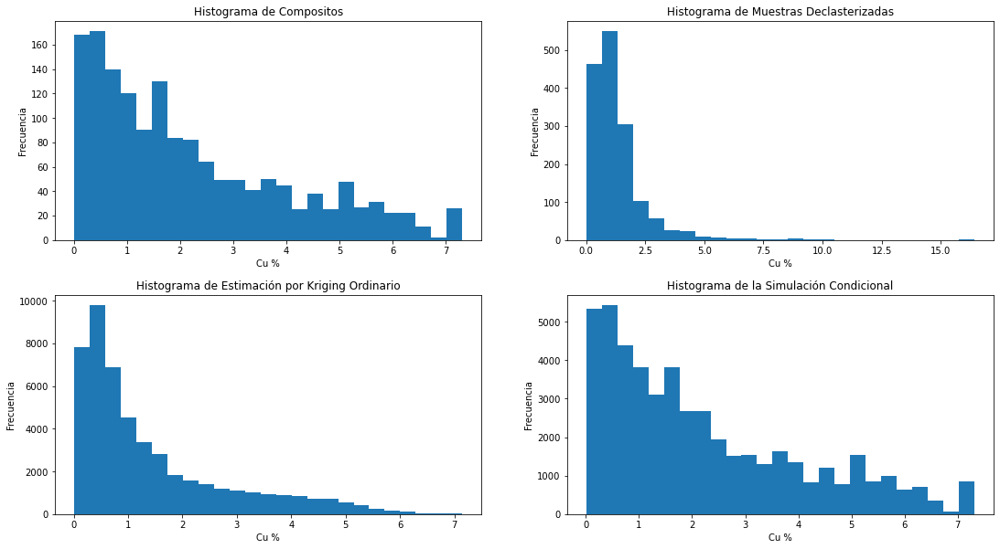

In [38]:
plt.subplot(221)
plt.hist(dataZ2_dh["Cu_out"], bins=25)
plt.title("Histograma de Compositos")
plt.xlabel("Cu %")
plt.ylabel("Frecuencia")
plt.subplot(222)
plt.hist(dataZ2_dh["Cu_dec"], bins=25)
plt.title("Histograma de Muestras Declasterizadas")
plt.xlabel("Cu %")
plt.ylabel("Frecuencia")
plt.subplot(223)
plt.hist(blkestimate["Cu_OK"], bins=25)
plt.title("Histograma de Estimación por Kriging Ordinario")
plt.xlabel("Cu %")
plt.ylabel("Frecuencia")
plt.subplot(224)
plt.hist(blkestimate["Cu_SGSIM"], bins=25)
plt.title("Histograma de la Simulación Condicional")
plt.xlabel("Cu %")
plt.ylabel("Frecuencia")

plt.subplots_adjust(right=2.5, top=2, hspace=0.25)
plt.show()  ## Comparación de histogramas

In [39]:
def roundBy(x, base=25):
    return base * round(x/base)

In [40]:
dataZ2_dh['x_round']=roundBy(dataZ2_dh['mid_x'])
dataZ2_dh['y_round']=roundBy(dataZ2_dh['mid_y'])
dataZ2_dh['z_round']=roundBy(dataZ2_dh['mid_z'], base=7.5)

<ipython-input-40-4132b2097c92>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-40-4132b2097c92>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-40-4132b2097c92>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



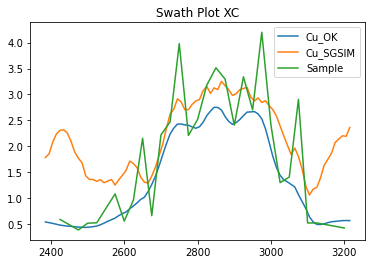

In [41]:
plt.plot (blkestimate.groupby('XC')[['Cu_OK']].mean(), label= 'Cu_OK')
plt.plot (blkestimate.groupby('XC')[['Cu_SGSIM']].mean(), label= 'Cu_SGSIM')
plt.plot (dataZ2_dh.groupby('x_round')[['Cu_out']].mean(), label= 'Sample')
plt.title('Swath Plot XC')
plt.legend()  #Swath Plot o análisis de la variación de las leyes de Cu en el eje X (Estimación y muestras)

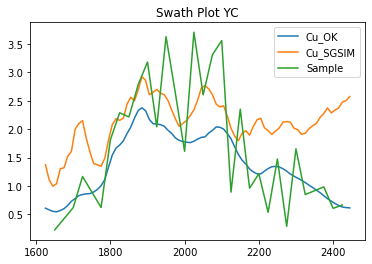

In [42]:
plt.plot (blkestimate.groupby('YC')[['Cu_OK']].mean(), label= 'Cu_OK')
plt.plot (blkestimate.groupby('YC')[['Cu_SGSIM']].mean(), label= 'Cu_SGSIM')
plt.plot (dataZ2_dh.groupby('y_round')[['Cu_out']].mean(), label= 'Sample')
plt.title('Swath Plot YC')
plt.legend()   #Swath Plot o análisis de la variación de las leyes de Cu en el eje Y (Estimación y muestras)

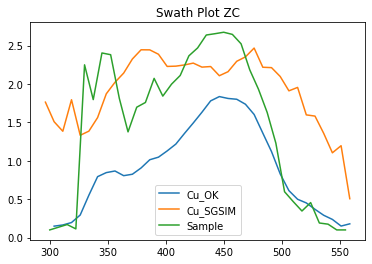

In [43]:
plt.plot (blkestimate.groupby('ZC')[['Cu_OK']].mean(), label= 'Cu_OK')
plt.plot (blkestimate.groupby('ZC')[['Cu_SGSIM']].mean(), label= 'Cu_SGSIM')
plt.plot (dataZ2_dh.groupby('z_round')[['Cu_out']].mean(), label= 'Sample')
plt.title('Swath Plot ZC')
plt.legend()  #Swath Plot o análisis de la variación de las leyes de Cu en el eje Z (Estimación y muestras)